In [22]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Conv2D, BatchNormalization, Conv2DTranspose, LeakyReLU, Reshape
from keras.callbacks import Callback
import keras

# Verificando se há GPU disponível
print("Qtde. de GPUs disponíveis: ", len(tf.config.list_physical_devices('GPU')))

Qtde. de GPUs disponíveis:  1


# Carregando e tratando os dados

In [23]:
# Carregando o dataset

path = "/cat-image-generator/dataset"

dataset = keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(128, 128), batch_size=32
)

# Normalizando as imagens para o intervalo 0, 1
dataset = dataset.map(lambda x: (x / 255.0))

Found 5153 files.


# Discriminador

In [24]:
# Modelo do discriminador

def discriminator():
    discriminator = Sequential()

    discriminator.add(Input(shape=(128,128,3)))
    discriminator.add(Conv2D(64, kernel_size=5, strides=2, padding='same'))
    discriminator.add(LeakyReLU(negative_slope=0.2))
    discriminator.add(Dropout(0.2))
    
    discriminator.add(Conv2D(128, kernel_size=5, strides=2, padding='same'))
    discriminator.add(LeakyReLU(negative_slope=0.2))
    discriminator.add(Dropout(0.2))

    discriminator.add(Conv2D(256, kernel_size=5, strides=2, padding='same'))
    discriminator.add(LeakyReLU(negative_slope=0.2))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.5))
    discriminator.add(BatchNormalization())
    
    discriminator.add(Dense(1, activation='sigmoid'))  

    return discriminator

discriminator = discriminator()
discriminator.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_192 (Conv2D)             │ (None, 64, 64, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_193 (Conv2D)             │ (None, 32, 32, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_194 (Conv2D)             │ (None, 16, 16, 256)    │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_193         │ (None, 65536)          │       262,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │        65,537 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,356,929 (5.18 MB)

 Trainable params: 1,225,857 (4.68 MB)

 Non-trainable params: 131,072 (512.00 KB)

# Gerador

In [25]:
# Definindo a dimensionalidade do vetor latente
LATENT_DIM = 100

# Modelo do gerador

def generator():
    generator = Sequential()
    
    generator.add(Input(shape=(LATENT_DIM,)))
    generator.add(Dense(8*8*512))
    generator.add(Reshape((8,8,512)))
    
    generator.add(Conv2DTranspose(512, kernel_size=5, strides=2, padding='same'))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(negative_slope=0.2))
    
    generator.add(Conv2DTranspose(256, kernel_size=5, strides=2, padding='same'))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(negative_slope=0.2))
    
    generator.add(Conv2DTranspose(128, kernel_size=5, strides=2, padding='same'))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(negative_slope=0.2))
    
    generator.add(Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(negative_slope=0.2))
    
    generator.add(Conv2D(3, kernel_size=5, padding='same', activation='tanh'))

    return generator

generator = generator()
generator.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 32768)          │     3,309,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 16, 16, 512)    │     6,554,112 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_194         │ (None, 16, 16, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 32, 32, 256)    │     3,277,056 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_195         │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 64, 64, 128)    │       819,328 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_196         │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_12 (LeakyReLU)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 128, 128, 64)   │       204,864 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_197         │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_195 (Conv2D)             │ (None, 128, 128, 3)    │         4,803 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,173,571 (54.07 MB)

 Trainable params: 14,171,651 (54.06 MB)

 Non-trainable params: 1,920 (7.50 KB)

# GAN

In [26]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]
    
    def train_step(self, real_images):
        # Criando vetores latentes aleatórios
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        
        # Criando imagens falsas com base nesses vetores
        generated_images = self.generator(random_latent_vectors)

        # Combinando as imagens falsas com as verdadeiras
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # Vinculando rótulos para as imagens falsas (0) e verdadeiras (1)
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))],
            axis=0
        )
        
        # Adicionando noise aleatório nos rótulos
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Treinando o discriminador
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Criando vetores latentes aleatórios
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Associando rótulos para dizer que todas as imagens são verdadeiras 
        misleading_labels = tf.zeros((batch_size, 1))

        # Treinando o gerador
        with tf.GradientTape() as tape:
            predictions = self.discriminator(
                self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights))

        # Atualizando as métricas
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(),
                "g_loss": self.g_loss_metric.result()}

# Callback

In [27]:
# Função para plotar as imagens durante o treinamento

def plot_images(generator, latent_dim, num_images=5):
    latent_vectors = np.random.uniform(-1, 1, size=(num_images, latent_dim))
    
    generated_images = generator.predict(latent_vectors)
    
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(1, 5, i + 1)
        plt.imshow(generated_images[i].reshape(128, 128, 3))
        plt.xticks([])
        plt.yticks([])
        
    plt.tight_layout()
    plt.show()

In [28]:
# Callback personalizado utilizado para chamar a função plot_images() durante o treinamento

class GANMonitor(Callback):
    def __init__(self, latent_dim, num_images=5, interval=5):
        self.latent_dim = latent_dim
        self.num_images = num_images
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.interval == 0:
            plot_images(self.model.generator, self.latent_dim, self.num_images)

# Treinamento

Epoch 1/100


I0000 00:00:1729622232.710008      98 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_concatenate_fusion_5', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_concatenate_fusion_4', 4 bytes spill stores, 4 bytes spill loads



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/stepstep - d_loss: 0.5055 - g_loss: 1.03


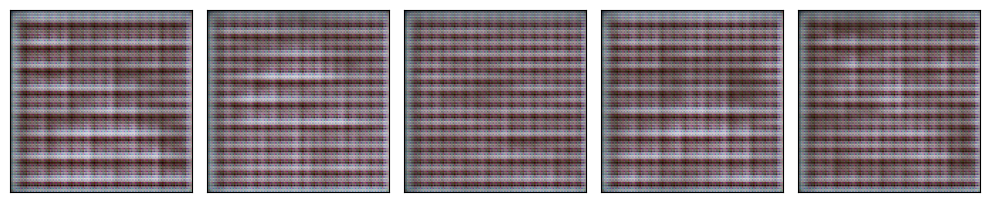

162/162 ━━━━━━━━━━━━━━━━━━━━ 38s 198ms/step - d_loss: 0.5058 - g_loss: 1.0378
Epoch 2/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - d_loss: 0.6552 - g_loss: 1.1409
Epoch 3/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6549 - g_loss: 0.9941
Epoch 4/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6321 - g_loss: 1.0842
Epoch 5/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6092 - g_loss: 1.0826
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step/step - d_loss: 0.6470 - g_loss: 1.157


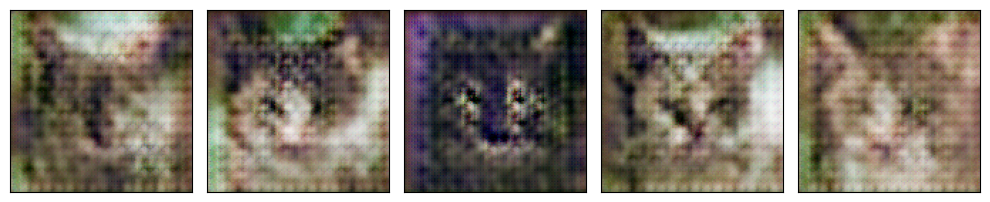

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6468 - g_loss: 1.1567
Epoch 7/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6304 - g_loss: 1.0785
Epoch 8/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6225 - g_loss: 0.9894
Epoch 9/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6237 - g_loss: 1.0027
Epoch 10/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6237 - g_loss: 0.9646
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step/step - d_loss: 0.6140 - g_loss: 1.033


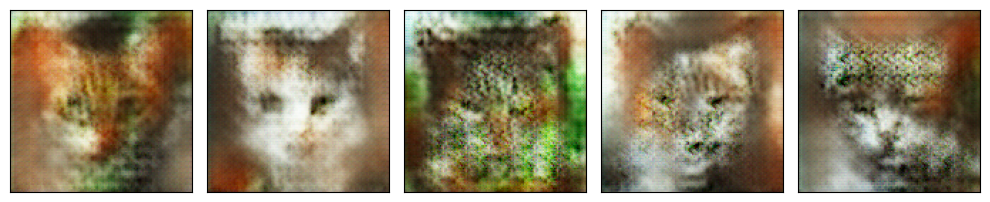

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6141 - g_loss: 1.0329
Epoch 12/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6488 - g_loss: 0.9557
Epoch 13/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6556 - g_loss: 0.9299
Epoch 14/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6502 - g_loss: 0.9206
Epoch 15/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6537 - g_loss: 0.9070
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6503 - g_loss: 0.927


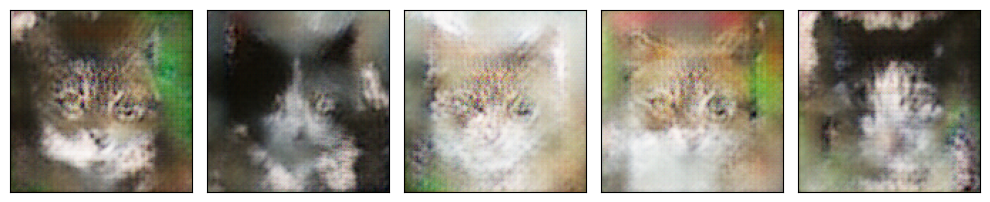

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6502 - g_loss: 0.9272
Epoch 17/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6452 - g_loss: 0.9111
Epoch 18/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6432 - g_loss: 0.9144
Epoch 19/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6439 - g_loss: 0.9325
Epoch 20/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6345 - g_loss: 0.9551
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step/step - d_loss: 0.6396 - g_loss: 0.940


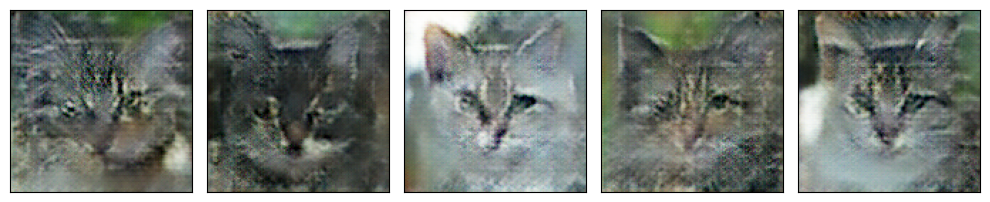

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6396 - g_loss: 0.9406
Epoch 22/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6581 - g_loss: 0.9360
Epoch 23/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6579 - g_loss: 0.9084
Epoch 24/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6576 - g_loss: 0.9058
Epoch 25/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6581 - g_loss: 0.8963
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6652 - g_loss: 0.891


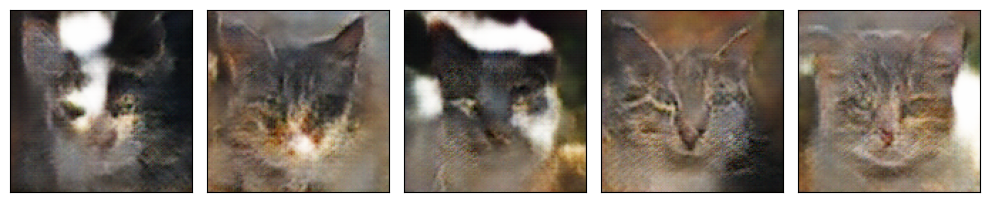

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6651 - g_loss: 0.8912
Epoch 27/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6624 - g_loss: 0.8734
Epoch 28/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6650 - g_loss: 0.8647
Epoch 29/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6622 - g_loss: 0.8624
Epoch 30/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6717 - g_loss: 0.8626
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6637 - g_loss: 0.862


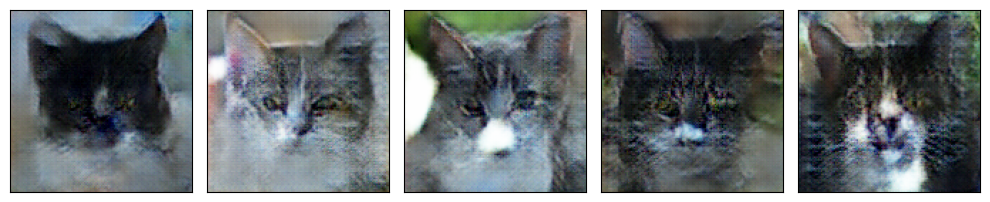

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6636 - g_loss: 0.8624
Epoch 32/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6705 - g_loss: 0.8688
Epoch 33/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6636 - g_loss: 0.8668
Epoch 34/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6662 - g_loss: 0.8640
Epoch 35/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6691 - g_loss: 0.8599
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6728 - g_loss: 0.851


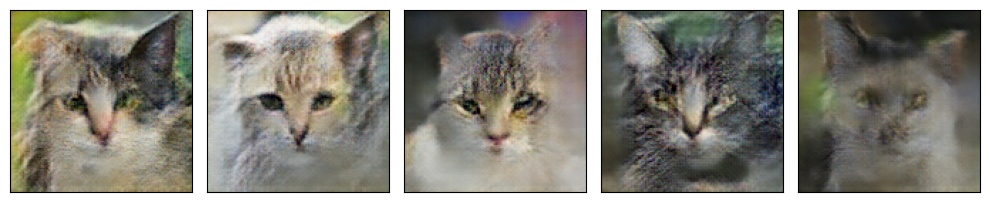

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6727 - g_loss: 0.8517
Epoch 37/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6777 - g_loss: 0.8486
Epoch 38/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6747 - g_loss: 0.8354
Epoch 39/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6823 - g_loss: 0.8352
Epoch 40/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6817 - g_loss: 0.8334
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6795 - g_loss: 0.818


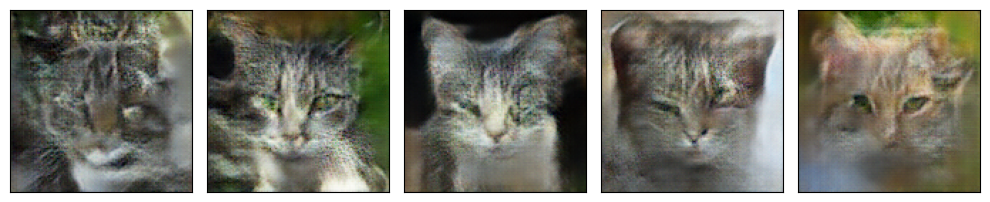

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6795 - g_loss: 0.8182
Epoch 42/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6791 - g_loss: 0.8241
Epoch 43/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6793 - g_loss: 0.8136
Epoch 44/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6811 - g_loss: 0.8161
Epoch 45/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6792 - g_loss: 0.8181
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6814 - g_loss: 0.806


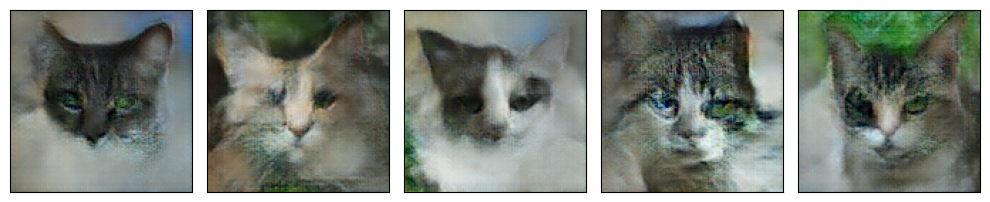

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6814 - g_loss: 0.8069
Epoch 47/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6809 - g_loss: 0.8151
Epoch 48/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6827 - g_loss: 0.8197
Epoch 49/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6778 - g_loss: 0.8110
Epoch 50/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6830 - g_loss: 0.8066
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6798 - g_loss: 0.805


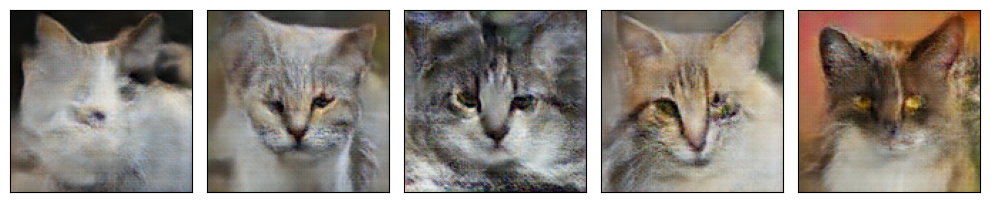

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6798 - g_loss: 0.8051
Epoch 52/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6821 - g_loss: 0.8079
Epoch 53/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6812 - g_loss: 0.8083
Epoch 54/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6792 - g_loss: 0.8051
Epoch 55/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6809 - g_loss: 0.8082
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step/step - d_loss: 0.6814 - g_loss: 0.805


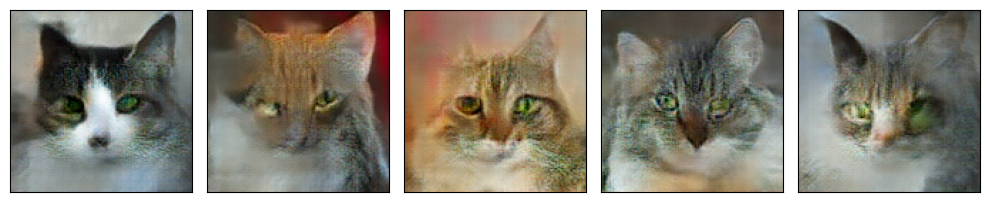

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - d_loss: 0.6814 - g_loss: 0.8054
Epoch 57/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6818 - g_loss: 0.8027
Epoch 58/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6857 - g_loss: 0.7966
Epoch 59/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6820 - g_loss: 0.8078
Epoch 60/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6811 - g_loss: 0.8067
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step/step - d_loss: 0.6833 - g_loss: 0.808


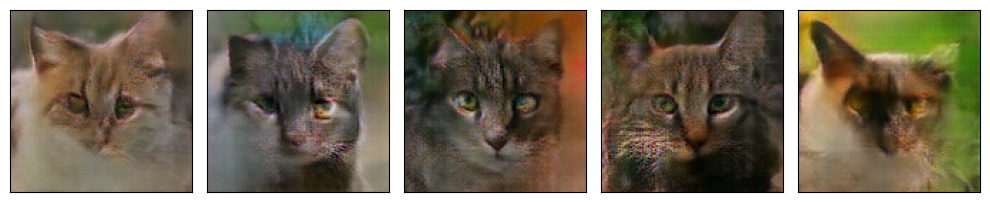

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - d_loss: 0.6833 - g_loss: 0.8080
Epoch 62/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6805 - g_loss: 0.8087
Epoch 63/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6815 - g_loss: 0.8106
Epoch 64/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6781 - g_loss: 0.8003
Epoch 65/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6796 - g_loss: 0.8089
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step/step - d_loss: 0.6854 - g_loss: 0.812


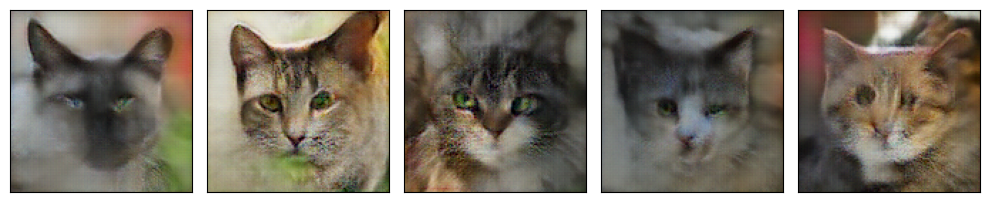

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - d_loss: 0.6853 - g_loss: 0.8125
Epoch 67/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6818 - g_loss: 0.8101
Epoch 68/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6802 - g_loss: 0.8000
Epoch 69/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6807 - g_loss: 0.8058
Epoch 70/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6812 - g_loss: 0.8127
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step/step - d_loss: 0.6788 - g_loss: 0.803


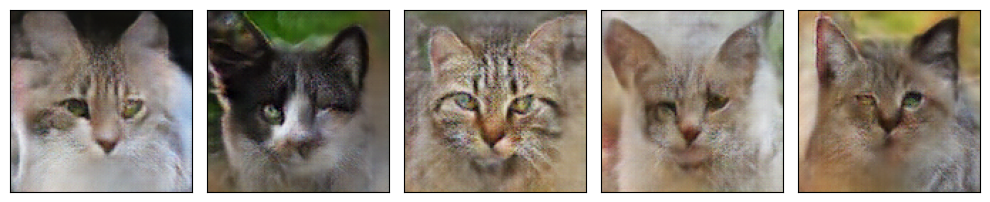

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6788 - g_loss: 0.8033
Epoch 72/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6792 - g_loss: 0.8065
Epoch 73/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6802 - g_loss: 0.8077
Epoch 74/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6817 - g_loss: 0.8061
Epoch 75/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6891 - g_loss: 0.8246
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step/step - d_loss: 0.6824 - g_loss: 0.804


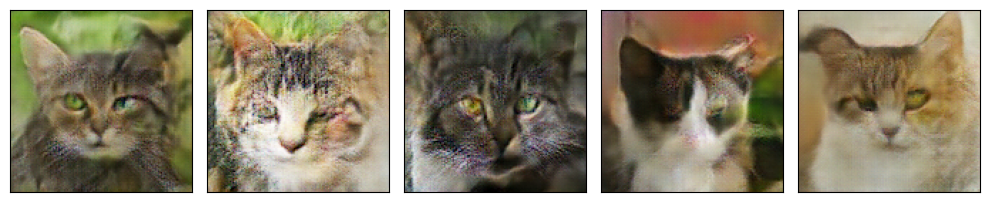

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6824 - g_loss: 0.8044
Epoch 77/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6837 - g_loss: 0.8078
Epoch 78/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6847 - g_loss: 0.8017
Epoch 79/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6819 - g_loss: 0.8074
Epoch 80/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6825 - g_loss: 0.8155
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step/step - d_loss: 0.6855 - g_loss: 0.808


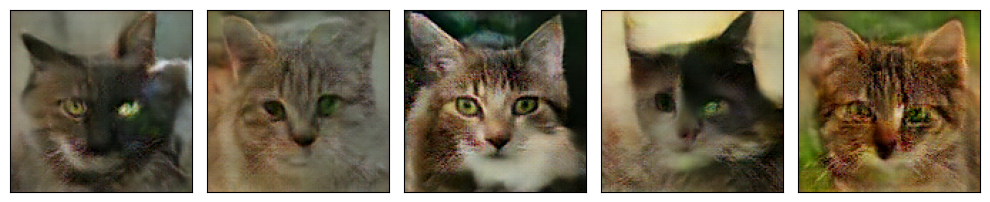

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6855 - g_loss: 0.8081
Epoch 82/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - d_loss: 0.6821 - g_loss: 0.8061
Epoch 83/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6852 - g_loss: 0.8065
Epoch 84/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6831 - g_loss: 0.8012
Epoch 85/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6850 - g_loss: 0.8044
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step/step - d_loss: 0.6841 - g_loss: 0.806


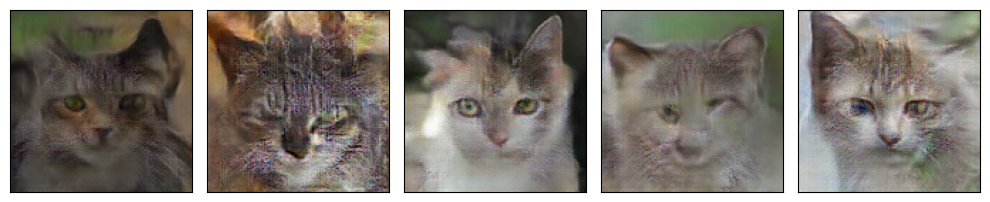

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 178ms/step - d_loss: 0.6840 - g_loss: 0.8069
Epoch 87/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6821 - g_loss: 0.7948
Epoch 88/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6823 - g_loss: 0.7986
Epoch 89/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6848 - g_loss: 0.8153
Epoch 90/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6809 - g_loss: 0.8034
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step/step - d_loss: 0.6830 - g_loss: 0.812


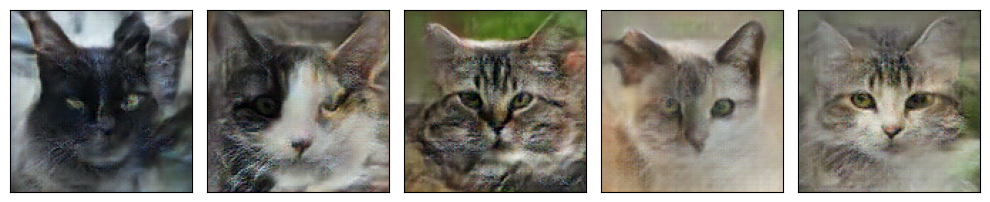

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6830 - g_loss: 0.8126
Epoch 92/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6818 - g_loss: 0.8083
Epoch 93/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6817 - g_loss: 0.8002
Epoch 94/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6805 - g_loss: 0.7967
Epoch 95/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6827 - g_loss: 0.8011
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step/step - d_loss: 0.6831 - g_loss: 0.806


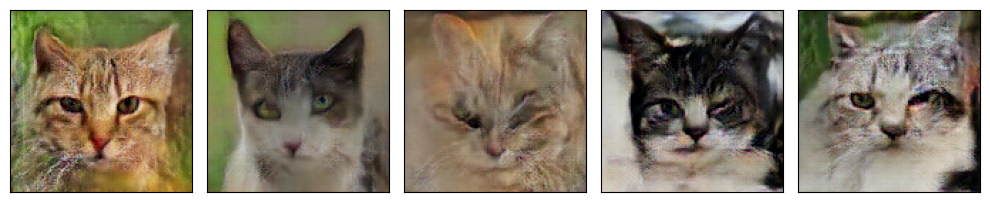

162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 179ms/step - d_loss: 0.6830 - g_loss: 0.8065
Epoch 97/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.6820 - g_loss: 0.8008
Epoch 98/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - d_loss: 0.6830 - g_loss: 0.8097
Epoch 99/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - d_loss: 0.6823 - g_loss: 0.7991
Epoch 100/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - d_loss: 0.6817 - g_loss: 0.8016


In [29]:
epochs = 100

gan_monitor = GANMonitor(latent_dim = LATENT_DIM)

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)

gan.compile(d_optimizer=keras.optimizers.RMSprop(learning_rate=0.00009),
            g_optimizer=keras.optimizers.RMSprop(learning_rate=0.00009),
            loss_fn=keras.losses.BinaryCrossentropy())

gan.fit(dataset, epochs=epochs, callbacks=[gan_monitor])

gan.save_weights('/kaggle/working/pesos.weights.h5')

# Configuração da GAN e carregamento dos pesos

In [30]:
from tensorflow.keras.models import load_model
weight_path = '/cat-image-generator/weights.weights.h5'

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)
gan.load_weights(weight_path)

"from tensorflow.keras.models import load_model\nweight_path = '/content/drive/MyDrive/Colab Notebooks/GAN/pesos.weights.h5'\n\ngan = GAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)\ngan.load_weights(weight_path)"

# Resultados

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 415ms/step


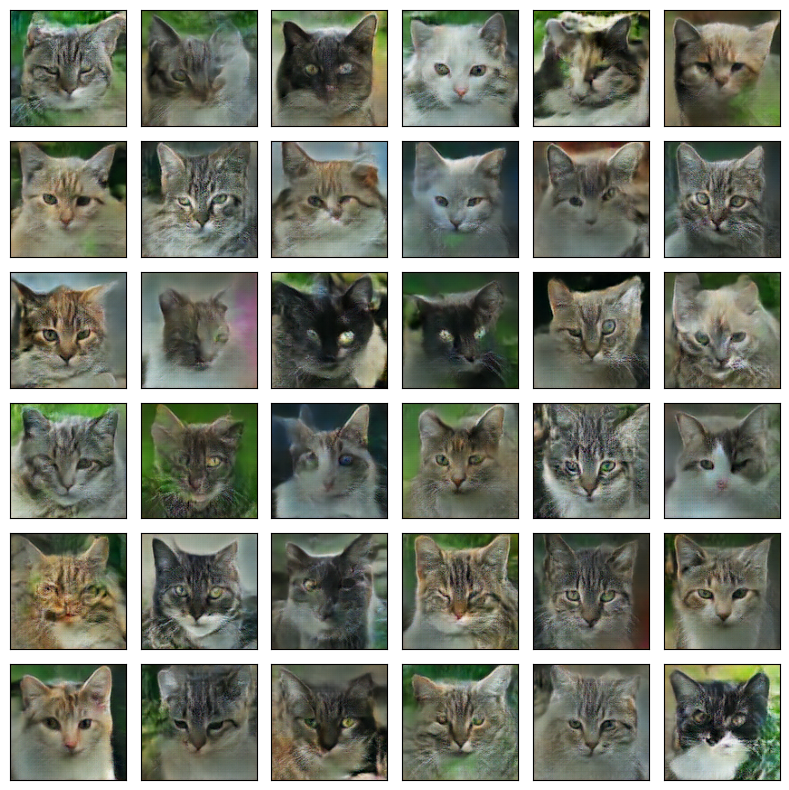

In [36]:
plt.figure(figsize=(8,8))
noise = tf.random.uniform((36, LATENT_DIM), minval=-1, maxval=1)
img = generator.predict(noise) 

for i in range(36):   
    plt.subplot(6, 6, i + 1)
    plt.imshow(img[i].reshape(128, 128, 3))
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

# Cálculo do FID

In [32]:
import os
import cv2

# Selecionando 10000 imagens reais e 1000 imagens geradas

real_images = os.listdir(path)

for i in range(1000):
    img = cv2.imread(os.path.join(path, real_images[i]))
    real_images[i] = img

real_images = real_images[:1000]
real_images = np.array(real_images)

noise = tf.random.uniform((25, LATENT_DIM), minval=-1, maxval=1)
fake_images = generator.predict(noise)
fake_images = np.array(fake_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [34]:
from numpy import cov, trace, iscomplexobj, asarray
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from skimage.transform import resize

# Função para redimensionar as imagens
def scale_images(images, new_shape):
    images_list = []
    for image in images:
        new_image = resize(image, new_shape, 0)
        images_list.append(new_image)
    return asarray(images_list)

# Função para calcular o FID
def calculate_fid(model, images1, images2):
    # Calcula as ativações
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    
    # Calcula médias e matrizes de covariância
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    
    # Soma das diferenças das médias
    ssdiff = np.sum((mu1 - mu2)**2.0)
    
    # Produto das covariâncias
    covmean = sqrtm(sigma1.dot(sigma2))
    
    # Se houver números complexos, converte para parte real
    if iscomplexobj(covmean):
        covmean = covmean.real
    
    # Verifica se a matriz de covariância é válida (adiciona um pequeno valor na diagonal)
    covmean = covmean + np.eye(covmean.shape[0]) * 1e-6
    
    # Calcula o FID
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

# Carregando o modelo InceptionV3
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))

print('Loaded', real_images.shape, fake_images.shape)

# Convertendo para float32
real_images = real_images.astype('float32')
fake_images = fake_images.astype('float32')

# Redimensionando as imagens
real_images = scale_images(real_images, (299,299,3))
fake_images = scale_images(fake_images, (299,299,3))
print('Scaled', real_images.shape, fake_images.shape)

# Aplicando o pré-processamento às imagens
real_images = preprocess_input(real_images)
fake_images = preprocess_input(fake_images)

# Calculando o FID
fid = calculate_fid(model, real_images, fake_images)
print('FID: %.3f' % fid)

Loaded (1000, 299, 299, 3) (25, 299, 299, 3)
Scaled (1000, 299, 299, 3) (25, 299, 299, 3)
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
FID: 39.283
